# MPHY0041 - Notebook

In [126]:
#import several libraries
import sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from scipy.special import expit
from scipy.stats import multivariate_normal

## Exercise 1: Decision Boundaries

In [140]:
# Read the data
df = pd.read_csv('./AD_CW1.csv')

# Get the data for CN and AD
df_CN = df[df['DX'] == 'CN']
df_AD = df[df['DX'] == 'Dementia']

### Determining the mean and standard deviation for CN and AD on the 'Amyloid' data

In [141]:
# Get the mean and std for each feature
PET_mean_CN = df_CN['Amyloid'].mean()
PET_mean_AD = df_AD['Amyloid'].mean()

PET_std_CN = df_CN['Amyloid'].std()
PET_std_AD = df_AD['Amyloid'].std()

# Get the shared std
PET_combined = np.concatenate((df_CN['Amyloid'], df_AD['Amyloid']))
std = PET_combined.std()

# Print the results
print('CN mean: ', PET_mean_CN)
print('AD mean: ', PET_mean_AD)
print('CN std: ', PET_std_CN)
print('AD std: ', PET_std_AD)
print('Shared std: ', std)

CN mean:  1.1178178707224338
AD mean:  1.403004580152672
CN std:  0.18516057530933516
AD std:  0.22092082148017694
Shared std:  0.23864712536788002


### Plotting the CN data as histograms to show the concentration of the data, alongside the gaussian distribution. As we can observe the gaussian is a good representation of the dataset

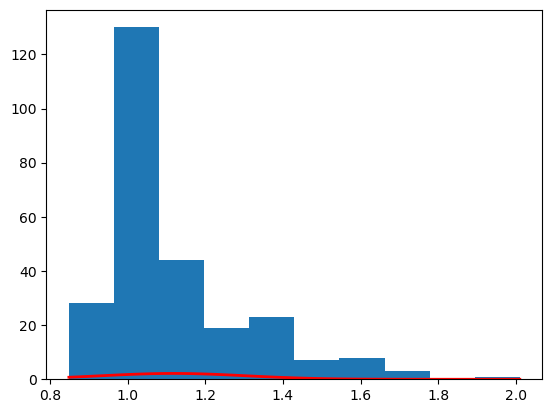

In [142]:
# Plot the histograms for CN
plt.hist(df_CN['Amyloid'])

x = np.linspace(df_CN['Amyloid'].min(), df_CN['Amyloid'].max(), 100)

# Plot the Gaussian distribution
gaussian = np.exp(-0.5*((x-PET_mean_CN)/PET_std_CN)**2) / (PET_std_CN*np.sqrt(2*np.pi))
plt.plot(x, gaussian, color='red', linewidth=2)

### The same thing we do for AD

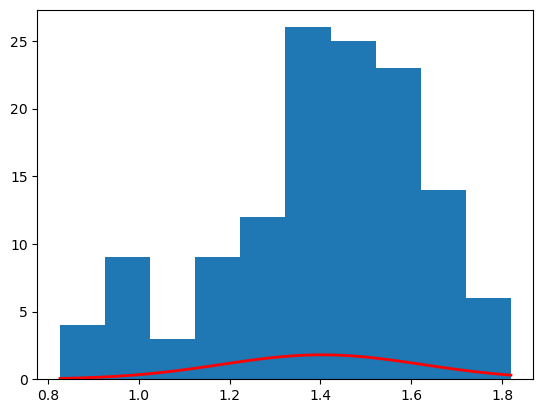

In [143]:
# Plot the histograms for AD
plt.hist(df_AD['Amyloid'])

x = np.linspace(df_AD['Amyloid'].min(), df_AD['Amyloid'].max(), 100)

# Plot the Gaussian distribution
gaussian = np.exp(-0.5*((x-PET_mean_AD)/PET_std_AD)**2) / (PET_std_AD*np.sqrt(2*np.pi))
plt.plot(x, gaussian, color='red', linewidth=2)

### Plotting both datasets as histograms in one plot, and in another plot the respective gaussian distributions with their own separate standard deviations

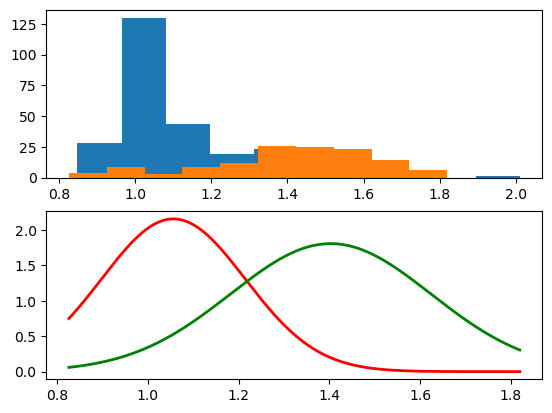

In [144]:
# Plot the histograms for CN and AD together
_, fig = plt.subplots(2)

fig[0].hist(df_CN['Amyloid'])

x = np.linspace(df_CN['Amyloid'].min(), df_CN['Amyloid'].max(), 1000)
gaussian_CN = np.exp(-0.5*((x-PET_mean_CN)/PET_std_CN)**2) / (PET_std_CN*np.sqrt(2*np.pi))

fig[0].hist(df_AD['Amyloid'])

x = np.linspace(df_AD['Amyloid'].min(), df_AD['Amyloid'].max(), 1000)
gaussian_AD = np.exp(-0.5*((x-PET_mean_AD)/PET_std_AD)**2) / (PET_std_AD*np.sqrt(2*np.pi))

fig[1].plot(x, gaussian_CN, color='red', linewidth=2)
fig[1].plot(x, gaussian_AD, color='green', linewidth=2)


### Getting the shared std and use this shared std to remodel the 2 gaussians. Calculating the decision boundary and plot

1.260411225437553


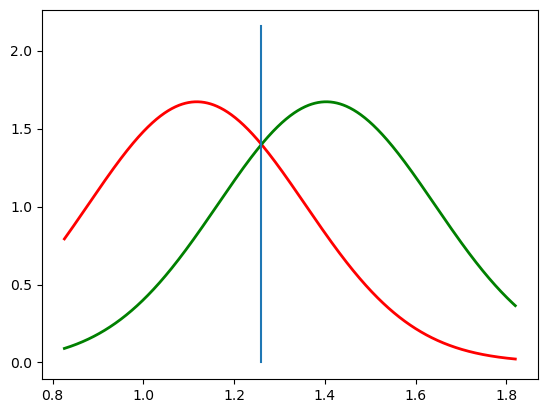

In [145]:
# Plot the histograms for CN and AD together
# But this time, use the shared std

# Calculate the decision boundary
decision_boundary = (PET_mean_CN + PET_mean_AD) / 2

gaussian_CN_shared = np.exp(-0.5*((x-PET_mean_CN)/std)**2) / (std*np.sqrt(2*np.pi))
gaussian_AD_shared = np.exp(-0.5*((x-PET_mean_AD)/std)**2) / (std*np.sqrt(2*np.pi))

# Print the decision boundary
print(decision_boundary)
y = np.linspace(0, np.max(np.max(gaussian_CN)), 1000)

plt.plot(x, gaussian_CN_shared, color='red', linewidth=2)
plt.plot(x, gaussian_AD_shared, color='green', linewidth=2)
plt.plot(np.full(1000, decision_boundary), y)

### Determining the decision boundary if the shared standard deviation is not used, by plotting the gaussian distributions with their own standard deviations. The decision boundary would go through the point that intersects the 2 gaussians (when the probability becomes higher that the point is in the second dataset than in the first)

Decision boundary X =  1.2189857857857858


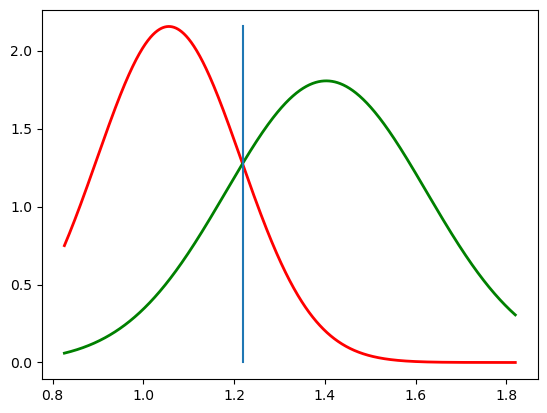

In [146]:
decision_boundary = 0

# This time we will not use the shared std
# Plotting the gaussian distributions for CN and AD with their individual std
# We will find the decision boundary by finding the point where the two distributions intersect

for val, f1, f2 in zip(x, gaussian_CN, gaussian_AD):
    # If the probability of AD is greater than the probability of CN
    if f1 <= f2:
        decision_boundary = val
        break

# Print the decision boundary
print('Decision boundary X = ', decision_boundary)
y = np.linspace(0, np.max(np.max(gaussian_CN)), 1000)

plt.plot(x, gaussian_CN, color='red', linewidth=2)
plt.plot(x, gaussian_AD, color='green', linewidth=2)
plt.plot(np.full(1000, decision_boundary), y)

### Preparing the data for linear regresion by taking the values of the 2 columns as parameters in the X variable, and the Y variable is -1 is the data is from the CN dataset and 1 if it is from the AD dataset

In [147]:
# Prepare the data for Linear Regression
X_CN = np.array(df_CN[['Amyloid', 'HV_ratio']])

# Set -1 for CN
y_CN = np.full([X_CN.shape[0], 1], -1)

X_AD = np.array(df_AD[['Amyloid', 'HV_ratio']])

# Set 1 for AD
y_AD = np.full([X_AD.shape[0], 1], 1)

X = np.vstack((X_CN, X_AD))
y = np.vstack((y_CN, y_AD)).squeeze()


### Linear regression method that gets as parameters X and y. It uses the LinearRegression() from sklearn and determines the decision boundary by using the coeficients to determine the equation of the boundary. Finally, it plots the 2 datasets and the decision boundary and returns the coeficients.

In [148]:
def linear_regression(X, y):
    # create a linear regression model
    lr = LinearRegression()
    
    # fit the linear regression model to the data
    lr.fit(X, y)

    # get the weights and intercept of the linear regression model
    w = lr.coef_
    b = lr.intercept_

    # get the slope and intercept of the decision boundary
    slope = -w[0] / w[1]
    intercept = -b / w[1]

    # get the x-axis limits of the plot
    x_min, x_max = X[:, 0].min() - 0.1, X[:, 0].max() + 0.1

    # compute the decision boundary line
    x_line = np.linspace(x_min, x_max, 100)
    y_line = slope * x_line + intercept

    # plot the scatter plot with different colors for CN and Dementia subjects
    plt.scatter(X_CN[:, 0], X_CN[:, 1], color='blue', label='CN')
    plt.scatter(X_AD[:, 0], X_AD[:, 1], color='red', label='Dementia')

    # plot the decision boundary
    plt.plot(x_line, y_line, color='black')

    # add axis labels and legend
    plt.xlabel('Amyloid')
    plt.ylabel('HV_ratio')
    plt.legend()

    # show the plot
    plt.show()

    return w, b


### Determining the linear regression model, plotting the results and moreover, presenting the performance on the 2 datasets (AD and CN) individually. We can see that the model successfully separating the two datasets, and the decision boundary being placed correctly

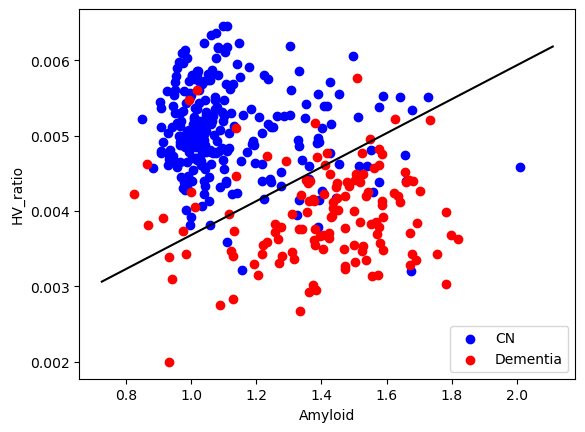

Weights:  [   1.39232398 -617.71496125]
General results
Wrong prediction:  41  out of:  394
MSE:  0.20812182741116753


CN results
Wrong prediction CN:  20  out of:  263
MSE CN:  0.1520912547528517


AD results
Wrong prediction AD:  21  out of:  131
MSE AD:  0.32061068702290074


In [149]:
# get the weights and intercept of the linear regression model
w, b = linear_regression(X, y)

# print the weights
print('Weights: ', w)

# Predict the labels for the whole training data
y_pred = X @ w + b
y_pred[y_pred <= 0] = -1
y_pred[y_pred > 0] = 1

print("General results")
print('Wrong prediction: ', int(np.sum(np.abs((y - y_pred) / 2))), ' out of: ', len(y))
print('MSE: ', np.mean(np.sqrt((y - y_pred) ** 2)))
print("\n")

# Testing how the model performs on the CN and AD data separately

# Predict the labels for the CN data
y_pred = X_CN @ w + b
y_pred[y_pred <= 0] = -1
y_pred[y_pred > 0] = 1

print("CN results")
print('Wrong prediction CN: ', int(np.sum(np.abs((y_CN.squeeze() - y_pred) / 2))), ' out of: ', len(y_CN))
print('MSE CN: ', np.mean(np.sqrt((y_CN - y_pred) ** 2)))
print("\n")

# Predict the labels for the AD data
y_pred = X_AD @ w + b
y_pred[y_pred <= 0] = -1
y_pred[y_pred > 0] = 1

print("AD results")
print('Wrong prediction AD: ', int(np.sum(np.abs((y_AD.squeeze() - y_pred) / 2))), ' out of: ', len(y_AD))
print('MSE AD: ', np.mean(np.sqrt((y_AD - y_pred) ** 2)))

### Getting data for MCI. Showing the mean and std for each label. Creating the mean and covariance matrices for multivariate normal distributions.

In [150]:
# Prepare the data for Logistic Regression for MCI
df_MCI = df[df['DX'] == 'MCI']
PET_mean_MCI = df_MCI['Amyloid'].mean()
PET_std_MCI = df_MCI['Amyloid'].std()

# Print the mean and std of the PET values for MCI, CN and AD
print('Amyloid')
print('Mean MCI: {}, Mean CN: {}, Mean AD: {}'.format(PET_mean_MCI, PET_mean_CN, PET_mean_AD))
print('std MCI: {}, std CN: {}, std AD: {}\n'.format(PET_std_MCI, PET_std_CN, PET_std_AD))

# Determine the mean and std of the HV values for MCI, CN and AD
HV_mean_MCI = df_MCI['HV_ratio'].mean()
HV_std_MCI = df_MCI['HV_ratio'].std()

HV_mean_CN = df_CN['HV_ratio'].mean()
HV_std_CN = df_CN['HV_ratio'].std()

HV_mean_AD = df_AD['HV_ratio'].mean()
HV_std_AD = df_AD['HV_ratio'].std()

# Print the mean and std of the HV values for MCI, CN and AD
print('HV_ratio')
print('Mean MCI: {}, Mean CN: {}, Mean AD: {}'.format(HV_mean_MCI, HV_mean_CN, HV_mean_AD))
print('std MCI: {}, std CN: {}, std AD: {}\n'.format(HV_std_MCI, HV_std_CN, HV_std_AD))

# Prepare to plot the histograms of the PET and HV values for MCI, CN and AD as multivariate normal distributions

# Getting the means
means_MCI = np.array([PET_mean_MCI, HV_mean_MCI])
means_CN = np.array([PET_mean_CN, HV_mean_CN])
means_AD = np.array([PET_mean_AD, HV_mean_AD])

# Getting the standard deviations
cov_MCI = np.cov(df_MCI[['Amyloid', 'HV_ratio']].values.T)
cov_CN = np.cov(df_CN[['Amyloid', 'HV_ratio']].values.T)
cov_AD = np.cov(df_AD[['Amyloid', 'HV_ratio']].values.T)

# Shared covariance matrix
cov = np.cov(df[['Amyloid', 'HV_ratio']].values.T)

print("Covariance MCI:\n", cov_MCI, '\n')
print("Covariance CN:\n", cov_CN, '\n')
print("Covariance AD:\n", cov_AD)

Amyloid
Mean MCI: 1.2184337378640775, Mean CN: 1.1178178707224338, Mean AD: 1.403004580152672
std MCI: 0.22462410157825596, std CN: 0.18516057530933516, std AD: 0.22092082148017694

HV_ratio
Mean MCI: 0.00471236159062617, Mean CN: 0.005081103870728595, Mean AD: 0.003940849480788508
std MCI: 0.0007982387622803732, std CN: 0.0005897676426907471, std AD: 0.0006202743910450882

Covariance MCI:
 [[ 5.04559870e-02 -5.51048223e-05]
 [-5.51048223e-05  6.37185122e-07]] 

Covariance CN:
 [[ 3.42844386e-02 -1.42358814e-05]
 [-1.42358814e-05  3.47825872e-07]] 

Covariance AD:
 [[4.88060094e-02 1.53908321e-05]
 [1.53908321e-05 3.84740320e-07]]


### Plotting the data

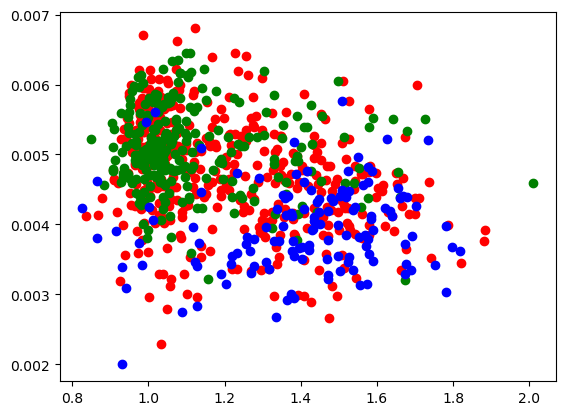

In [151]:
# Scatter plot of the PET and HV values for MCI, CN and AD
X_MCI = np.array(df_MCI[['Amyloid', 'HV_ratio']])
y_MCI = np.full([X_MCI.shape[0], 1], -1)

X_CN = np.array(df_CN[['Amyloid', 'HV_ratio']])
y_CN = np.full([X_CN.shape[0], 1], -1)

X_AD = np.array(df_AD[['Amyloid', 'HV_ratio']])
y_AD = np.full([X_AD.shape[0], 1], 1)

X = np.vstack((X_MCI, X_CN, X_AD))
y = np.vstack((y_MCI, y_CN, y_AD)).squeeze()

plt.scatter(X_MCI[:, 0], X_MCI[:, 1], color='red')
plt.scatter(X_CN[:, 0], X_CN[:, 1], color='green')
plt.scatter(X_AD[:, 0], X_AD[:, 1], color='blue')


### Plotting the multivariate distributions specific to the dataset labels. We can observe from the image above and the image below that the distributions represent correctly the spread of the data for each one of the labels MCI, CN, AD. In this image each distribution is plotted with their own covariance matrix.

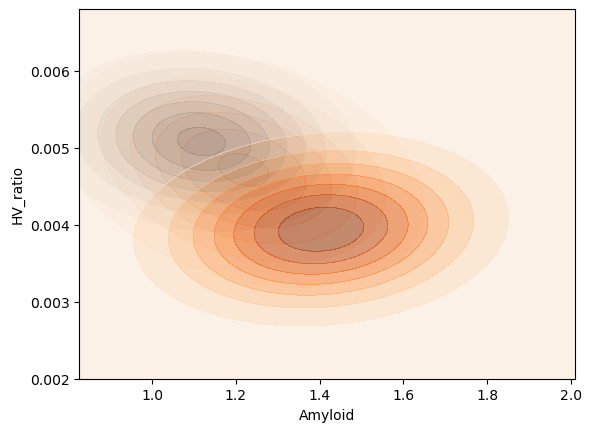

In [152]:
x_min, x_max = df['Amyloid'].min(), df['Amyloid'].max()
y_min, y_max = df['HV_ratio'].min(), df['HV_ratio'].max()

# Generate a grid of x and y values using linspace
x, y = np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100)
X, Y = np.meshgrid(x, y)
pos = np.empty(X.shape + (2,))
pos[:, :, 0] = X
pos[:, :, 1] = Y

# Set the mean and covariance of the multivariate normal distributions
rv1 = multivariate_normal(means_MCI, cov_MCI)
rv2 = multivariate_normal(means_CN, cov_CN)
rv3 = multivariate_normal(means_AD, cov_AD)

# Plot the contours of the multivariate normal distributions
Z1 = rv1.pdf(pos)
Z2 = rv2.pdf(pos)
Z3 = rv3.pdf(pos)

plt.contourf(X, Y, Z1, cmap='Oranges', alpha=0.5)
plt.contourf(X, Y, Z2, cmap='Greys', alpha=0.5)
plt.contourf(X, Y, Z3, cmap='Oranges', alpha=0.5)
plt.xlabel('Amyloid')
plt.ylabel('HV_ratio')
plt.show()

### In this plot, each distribution is plotted with the shared covariance matrix

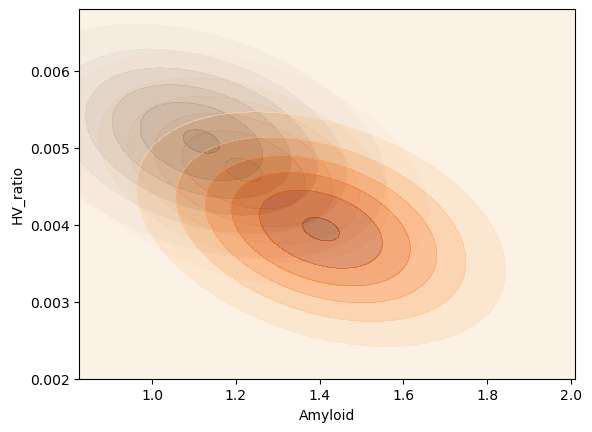

In [153]:
# Shared covariance matrix multivariate normal distributions
rv1 = multivariate_normal(means_MCI, cov)
rv2 = multivariate_normal(means_CN, cov)
rv3 = multivariate_normal(means_AD, cov)

Z1 = rv1.pdf(pos)
Z2 = rv2.pdf(pos)
Z3 = rv3.pdf(pos)

plt.contourf(X, Y, Z1, cmap='Oranges', alpha=0.5)
plt.contourf(X, Y, Z2, cmap='Greys', alpha=0.5)
plt.contourf(X, Y, Z3, cmap='Oranges', alpha=0.5)
plt.xlabel('Amyloid')
plt.ylabel('HV_ratio')
plt.show()

### Calculating the coeficients of the decision boundaries between CN and MCI, CN and AD and MCI and AD. Plot them alongside the points from the dataset. The red line separates CN from MCI, the blue one separates CN from AD and the green one separates MCI from AD. We can observe that the decision boundaries are correctly traced, the most obvious one we can observe being the blue line, because the green points do no intersect so much with the blue points so the separation between them is obvious.

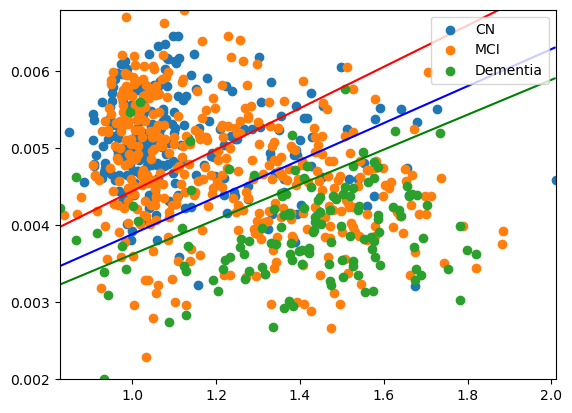

In [154]:
# Calculate the pooled variance-covariance matrix
pi = np.array([0.33, 0.33, 0.33])
S = pi[0]*cov_CN + pi[1]*cov_MCI + pi[2]*cov_AD

# Compute the coefficients for each linear decision boundary
w_CN_MCI = np.linalg.inv(S).dot(means_CN - means_MCI)
b_CN_MCI = -0.5 * (means_CN.T.dot(np.linalg.inv(S)).dot(means_CN)) + 0.5 * (means_MCI.T.dot(np.linalg.inv(S)).dot(means_MCI)) + np.log(pi[0]/pi[1])

w_CN_AD = np.linalg.inv(S).dot(means_CN - means_AD)
b_CN_AD = -0.5 * (means_CN.T.dot(np.linalg.inv(S)).dot(means_CN)) + 0.5 * (means_AD.T.dot(np.linalg.inv(S)).dot(means_AD)) + np.log(pi[0]/pi[2])

w_MCI_AD = np.linalg.inv(S).dot(means_MCI - means_AD)
b_MCI_AD = -0.5 * (means_MCI.T.dot(np.linalg.inv(S)).dot(means_MCI)) + 0.5 * (means_AD.T.dot(np.linalg.inv(S)).dot(means_AD)) + np.log(pi[1]/pi[2])

# Generate a grid of x and y values using linspace
x_min, x_max = df['Amyloid'].min(), df['Amyloid'].max()
y_min, y_max = df['HV_ratio'].min(), df['HV_ratio'].max()
x, y = np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100)
X, Y = np.meshgrid(x, y)

# Compute the decision boundaries
db_CN_MCI = X * w_CN_MCI[0] + Y * w_CN_MCI[1] + b_CN_MCI
db_CN_AD = X * w_CN_AD[0] + Y * w_CN_AD[1] + b_CN_AD
db_MCI_AD = X * w_MCI_AD[0] + Y * w_MCI_AD[1] + b_MCI_AD

# Generate the scatterplot with decision boundaries
fig, ax = plt.subplots()
ax.scatter(df_CN['Amyloid'], df_CN['HV_ratio'], label='CN')
ax.scatter(df_MCI['Amyloid'], df_MCI['HV_ratio'], label='MCI')
ax.scatter(df_AD['Amyloid'], df_AD['HV_ratio'], label='Dementia')

# Plot the decision boundary line for CN vs MCI
ax.contour(X, Y, db_CN_MCI, levels=[0], colors='r')

# Plot the decision boundary line for CN vs AD
ax.contour(X, Y, db_CN_AD, levels=[0], colors='b')

# Plot the decision boundary line for MCI vs AD
ax.contour(X, Y, db_MCI_AD, levels=[0], colors='g')
ax.legend()
plt.show()


### Plotting the data as multivariate distribution so we can assess better the correctness of our decision boundary. We can observe that they are placed halfway between distributions, and therefore are correct.

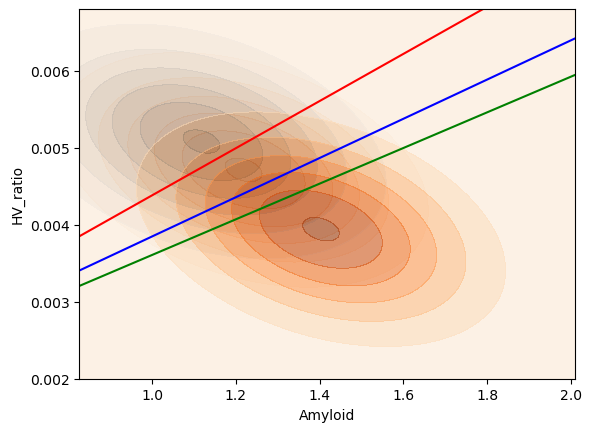

In [155]:
# Calculate the pooled variance-covariance matrix
pi = np.array([0.33, 0.33, 0.33])
S = cov

# Compute the coefficients for each linear decision boundary
w_CN_MCI = np.linalg.inv(S).dot(means_CN - means_MCI)
b_CN_MCI = -0.5 * (means_CN.T.dot(np.linalg.inv(S)).dot(means_CN)) + 0.5 * (means_MCI.T.dot(np.linalg.inv(S)).dot(means_MCI)) + np.log(pi[0]/pi[1])

w_CN_AD = np.linalg.inv(S).dot(means_CN - means_AD)
b_CN_AD = -0.5 * (means_CN.T.dot(np.linalg.inv(S)).dot(means_CN)) + 0.5 * (means_AD.T.dot(np.linalg.inv(S)).dot(means_AD)) + np.log(pi[0]/pi[2])

w_MCI_AD = np.linalg.inv(S).dot(means_MCI - means_AD)
b_MCI_AD = -0.5 * (means_MCI.T.dot(np.linalg.inv(S)).dot(means_MCI)) + 0.5 * (means_AD.T.dot(np.linalg.inv(S)).dot(means_AD)) + np.log(pi[1]/pi[2])

# Generate a grid of x and y values using linspace
x_min, x_max = df['Amyloid'].min(), df['Amyloid'].max()
y_min, y_max = df['HV_ratio'].min(), df['HV_ratio'].max()
x, y = np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100)
X, Y = np.meshgrid(x, y)
pos = np.empty(X.shape + (2,))
pos[:, :, 0] = X
pos[:, :, 1] = Y

# Compute the decision boundaries
db_CN_MCI = X * w_CN_MCI[0] + Y * w_CN_MCI[1] + b_CN_MCI
db_CN_AD = X * w_CN_AD[0] + Y * w_CN_AD[1] + b_CN_AD
db_MCI_AD = X * w_MCI_AD[0] + Y * w_MCI_AD[1] + b_MCI_AD

# Generate the scatterplot with decision boundaries
fig, ax = plt.subplots()
ax.contour(X, Y, db_CN_MCI, levels=[0], colors='r')
ax.contour(X, Y, db_CN_AD, levels=[0], colors='b')
ax.contour(X, Y, db_MCI_AD, levels=[0], colors='g')
plt.contourf(X, Y, Z1, cmap='Oranges', alpha=0.5)
plt.contourf(X, Y, Z2, cmap='Greys', alpha=0.5)
plt.contourf(X, Y, Z3, cmap='Oranges', alpha=0.5)
plt.xlabel('Amyloid')
plt.ylabel('HV_ratio')
plt.show()


## Exercise 2: Classifier Implementations

### a) Complete the code for Rosenblatt's Perceptron

In [156]:
#implement rosenblatt's perceptron for a 2D example
#Y are the target labels (-1,1)
#X is the input data
#rho is the learning rate
#max_iter controls the maximum number of iterations
##Note: both, rho and max_iter can be left to their default values

#function returns the intercept_ (\beta_0) and the coefficients_ (\beta_i)
def rosen_perceptron(Y, X, rho=0.1, max_iter = 1000):
  #initialize with random parameters
  intercept_ = np.random.randn()
  #as many coefficients as there are columns (features) in X
  coef_ = np.random.randn(X.shape[1])
  
  #make predictions
  Y_hat = intercept_ + np.dot(X, coef_)  
  
  #compute the list of misclassified samples and store in M  
  M = [i for i in range(len(Y)) if Y[i] * Y_hat[i] <= 0]

  iter = 0
  #as long as there are misclassified samples in M and we have not reached the
  #maximal number of interations continue to update coefficients etc.
  while len(M) > 0 and iter < max_iter:

    #make gradient step (update intercept and coefficients)
    intercept_ += rho * np.sum(Y[M])
    coef_      += rho * np.dot(Y[M].reshape(-1), X[M])

    #make predictions using new parameters
    Y_hat = intercept_ + np.dot(X, coef_)

    ##update the list of misclassified samples and store in M  
    M = [i for i in range(len(Y)) if Y[i] * Y_hat[i] <= 0]
    
    iter += 1
  
  return intercept_, coef_

### Visualising the data

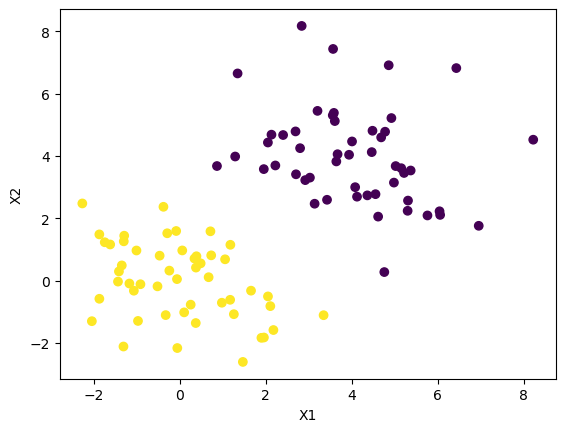

In [157]:
# Read data
df = pd.read_csv('./sim_data.csv')

# Set up X and Y
X = np.array(df[['X1', 'X2']])
Y = np.array(df[['Y']]).squeeze()

# Plot the data
plt.scatter(X[:,0], X[:,1], c=Y)
plt.xlabel('X1')
plt.ylabel('X2')
plt.show()

### Method to determine and plot the decision boundary given the features X and the labels Y and the coefficients of the classification algorithm

In [158]:
def plot_boundary(X, Y, coef_, intercept_):
    # compute the slope and intercept of the decision boundary
    slope = -coef_[0] / coef_[1]
    intercept = -intercept_ / coef_[1]

    # get the x-axis limits of the plot
    x_min, x_max = X[:, 0].min() - 0.1, X[:, 0].max() + 0.1

    # compute the decision boundary line
    x_line = np.linspace(x_min, x_max, 100)
    y_line = slope * x_line + intercept

    # split the data into CN and Dementia subjects
    X_minus = X[Y.squeeze() == -1]
    X_plus = X[Y.squeeze() == 1]
    
    # plot the scatter plot with different colors for CN and Dementia subjects
    plt.scatter(X_minus[:, 0], X_minus[:, 1], color='yellow')
    plt.scatter(X_plus[:, 0], X_plus[:, 1], color='purple')

    # plot the decision boundary
    plt.plot(x_line, y_line, color='black')


### Fitting the rosen_perceptron model using different learning rates. Running it 5 times with the same learning rate would produce the same plots, as the model converges to the right solution in max_iter steps, diminishing the effect of the randomness from the initialization of the coefficients. All five plot produce good results.

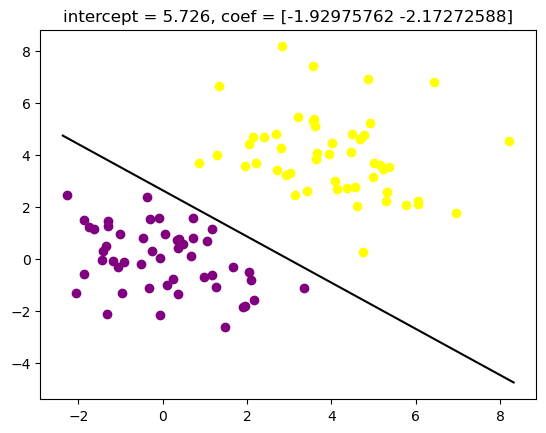

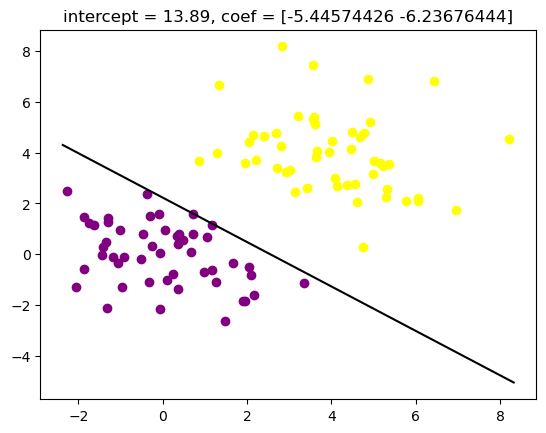

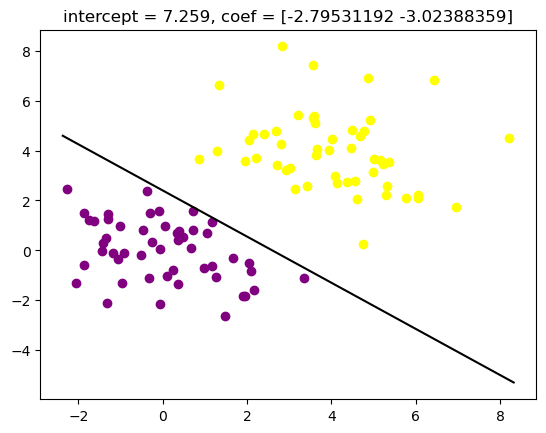

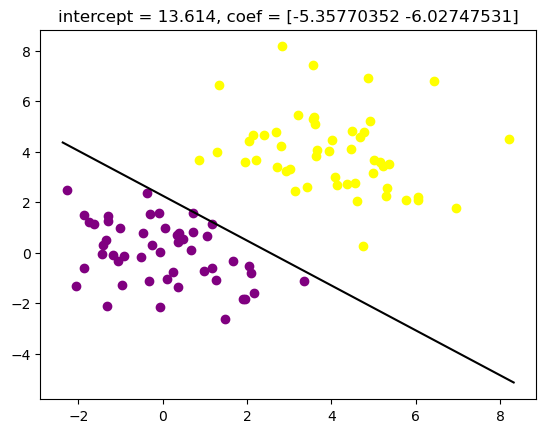

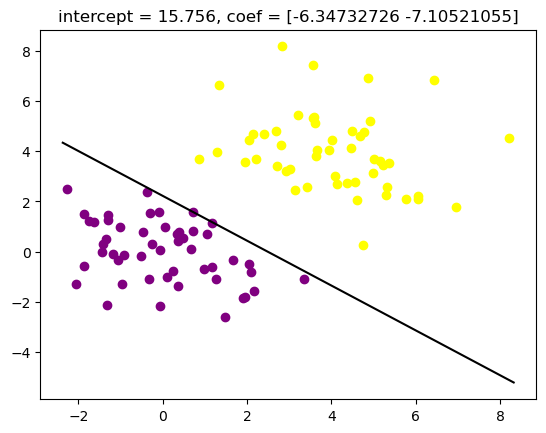

In [165]:
for i in range(5):
    # train the model
    intercept_, coef_ = rosen_perceptron(Y, X)

    # Adding the intercept and coef to the title of the plot
    plt.title('intercept = ' + str(round(intercept_, 3)) + ', coef = ' + str(coef_))
    plot_boundary(X, Y, coef_, intercept_)
    plt.show()


### b) Complete the code for LogisticRegression via Gradient Descent

In [122]:
#define the sigmoid function
def sigmoid(value):
    return expit(value)

In [176]:
#this function fits Logistic Regression using Gradient Descent
#inputs are
#y:         target labels (0,1)
#features:  input feature matrix
#eps:       tolerance for the stopping criterion
#rho:       step size in gradient descent

#this function returns the beta coefficients for a LogisticRegression model
#the first entry (betas[0] is the intercept)
def fit_LogReg_GRAD(y, features, eps=0.00000000001, rho=0.01):
    #sample size
    N = features.shape[0]
    #feature dim
    p = features.shape[1] + 1
    #initalize beta with 0s
    betas = np.zeros(p)

    #add column of 1 to X
    X = np.c_[np.ones(N),features]
    #compute predictions for class 1
    prob1 = sigmoid( X @ betas)
    #compute predictions for class 2
    prob0 = 1.0 - prob1

    old_cost = 100000000
    #compute the cost (J) of the current solution
    #COMPLETE THIS LINE
    cost = -np.mean(y * np.log(prob1) + (1-y) * np.log(prob0))
    #as long as the there is a differentce between old and new cost that is larger
    #than the tolerance we update the parameters
    while np.abs(old_cost - cost) > eps:
        #beta update (one step of the gradient descent)
        #COMPLETE THIS LINE
        betas -= rho * np.mean((prob1 - y)[:,np.newaxis] * X, axis=0)

        #update probabilities
        prob1 = sigmoid( X @ betas)
        prob0 = 1.0 - prob1
        
        #deal with 'underflow'
        prob1[prob1 == 0] = 0.000001
        prob0[prob0 == 0] = 0.000001

        old_cost = cost
        #recompute cost
        #COMPLETE THIS LINE
        cost = -np.mean(y * np.log(prob1) + (1-y) * np.log(prob0))

        #reduce learning rate in case the cost increased
        if cost > old_cost:
          rho /= 2
            
    return(betas), cost

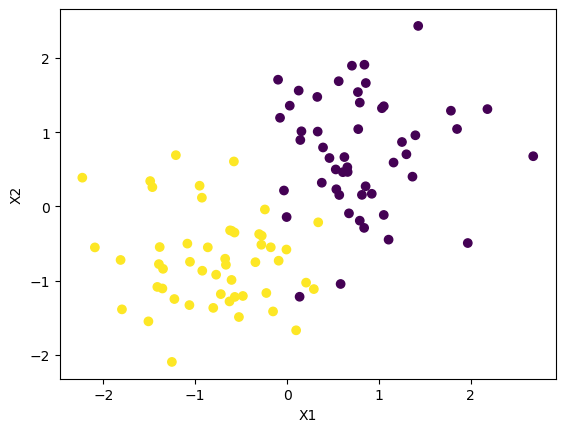

In [177]:
# Read data
df = pd.read_csv('./sim_data_nonsep.csv')

# Set up X and Y
X = np.array(df[['X1', 'X2']])
Y = np.array(df[['Y']]).squeeze()

# Plot the data
plt.scatter(X[:,0], X[:,1], c=Y)
plt.xlabel('X1')
plt.ylabel('X2')
plt.show()

### Plotting the data with the coefficients from LogReg_GRAD, and also showing the final cost. As the datasets are not separated from each other and the purple dots zone intersects the yellow dots zone, I consider that this is a reasonable decision boundary.

Cost:  -176.90072052071207
Beta coefficients:  [-193.9720114  -230.84059839 -201.67951461]


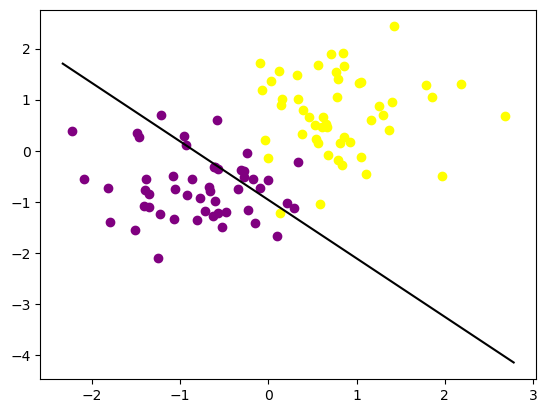

In [178]:
# Fit the model
betas, cost = fit_LogReg_GRAD(Y, X, 0.00001)

print('Cost: ', cost)
print('Beta coefficients: ', betas)

# Plot the decision boundary
plot_boundary(X, Y, betas[1:], betas[0])
plt.show()


### c) Complete the code for HingeLoss with L2 regularization using Gradient Descent

In [179]:
#this function fits a linear classifier with Hinge Loss and L2 regularization using Gradient Descent
#inputs are
#y:         target labels (0,1)
#features:  input feature matrix
#lam:       the regularization parameter \lambda
#eps:       tolerance for the stopping criterion
#rho:     step size in gradient descent
#max_iter:  maximum number of iterations the algorithm is run

#this function returns the beta coefficients for a HingeL2 linear model
#the first entry (betas[0] is the intercept)

def fit_HingeL2_GRAD(y, features, lam=1, eps=0.00000000001, rho=0.01, max_iter=1000):
    #sample size
    N = features.shape[0]
    #feature dim
    p = features.shape[1] + 1
    #initalize beta random values  
    betas = np.random.normal(size=p)

    #add column of 1 to X
    X = np.c_[np.ones(N),features]
    #prediction, using a linear model
    yhat = X @ betas
  
    #initialize old_cost with a very high value
    old_cost = 100000000
    #compute the cost (J) of the current solution
    #COMPLETE THIS 
    cost = np.sum(np.maximum(0, 1 - y * yhat)) + (lam/2) * np.linalg.norm(betas[1:])
      
    epoch=0
    while epoch < max_iter and np.abs(old_cost - cost) > eps:
        epoch += 1
        #beta update (one step of the gradient descent)
        #COMPLETE THIS 
        gradient = np.zeros_like(betas)
        for i in range(N):
            if y[i]*yhat[i] < 1:
                gradient += -y[i]*X[i,:] + lam*betas
            else:
                gradient += lam*betas
        betas -= rho * gradient

        #update prediction
        yhat = X @ betas    
        
        old_cost = cost
        #recompute cost
        #COMPLETE THIS (same as above)        
        cost =  np.sum(np.maximum(0, 1 - y * yhat)) + (lam/2) * np.linalg.norm(betas[1:])

        #reduce learning rate in case the cost increased
        if cost > old_cost:
          rho /= 2
    return(betas), cost

### Showing the final cost of the models for fitting with lambdas 0.01, 1 and 100. The smallest lambda produces the lowest cost.

In [180]:
# Train the model with different regularization parameters
betas_lam_001, cost001 = fit_HingeL2_GRAD(Y, X, lam=0.01)
betas_lam_1, cost1 = fit_HingeL2_GRAD(Y, X, lam=1)
betas_lam_100, cost100 = fit_HingeL2_GRAD(Y, X, lam=100)

print('Cost001: {}, Cost1: {}, Cost100: {}'.format(cost001, cost1, cost100))
print('Beta coefficients for lam=0.01: ', betas_lam_001)
print('Beta coefficients for lam=1: ', betas_lam_1)
print('Beta coefficients for lam=100: ', betas_lam_100)

Cost001: 8.626851890347139, Cost1: 37.549516021783745, Cost100: 99.38673426190917
Beta coefficients for lam=0.01:  [ 0.11941051 -1.71736223 -1.04765529]
Beta coefficients for lam=1:  [ 0.00890214 -0.478691   -0.41635916]
Beta coefficients for lam=100:  [ 6.58198004e-15 -7.96935117e-03 -7.17066954e-03]


### Plotting the results corresponding to the lambda variables. I consider that all 3 plots produce similar results, good ones, and I think a reason behind this is that the solution converges in max_iter steps and that the learning rate is reduced in half when needed.

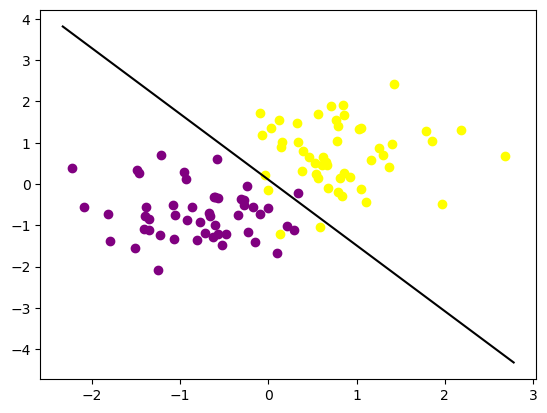

In [276]:
# Plot the decision boundary for lambda = 0.01
plot_boundary(X, Y, betas_lam_001[1:], betas_lam_001[0])
plt.show()

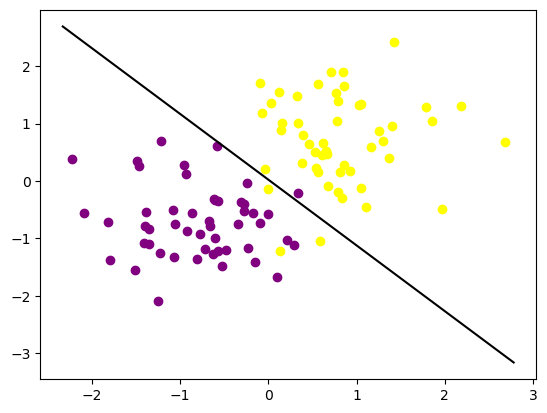

In [277]:
# Plot the decision boundary for lambda = 1
plot_boundary(X, Y, betas_lam_1[1:], betas_lam_1[0])
plt.show()

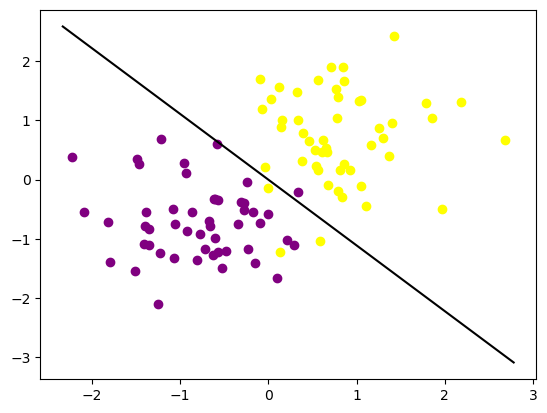

In [278]:
# Plot the decision boundary for lambda = 100
plot_boundary(X, Y, betas_lam_100[1:], betas_lam_100[0])
plt.show()

## Exercise 3: Suggest improvements to the ML pipeline



1.  Splitting the dataset into train and test datasets and use cross-validation. As mentioned in the text, RA is now tesing his model on the same dataset that he used for training. This practice leads to overfitting as the parameters of the model can be optimized for the training dataset, but produce bad results when tested on slightly different data. When doing cross-validation, different training datasets are picked from the initial dataset, avoiding overfitting and therefore estimating the performance of the model on unseen data.
2.  The correlation coefficient, a measure of the linear relationship between two variables, even though they are the predicted values and the actual values, may not be the best evaluation metric for a classification job. Metrics like accuracy, precision and recall are better solutions when assessing the model's performance.
3.  Using a more balanced dataset. There are almost twice as much CN's than AD's, fact that can lead into training a model that is biased towards the majority label. A solution for this problem is sampling the CN's resulting approximately as many CN's as AD's.
4.  Ridge Regression was the only model that was used to train the model; it was not compared to other models such as Lasso regression, gradient descent, logistic regression, support vector machines, or neural networks. The best-performing model should be chosen by RA after evaluating the performance of several models on the dataset.



## Exercise 4: Vessel Segmentation

In [56]:
import imageio
import numpy as np
import pandas as pd
import sklearn
import matplotlib.pyplot as plt
from sklearn import ensemble
from sklearn import svm
from sklearn import model_selection
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_auc_score
from sklearn.feature_extraction import image
from skimage.filters import scharr
from skimage.color import rgb2gray
from skimage.filters import median


In [3]:
train_path = './fundus/train/'
vali_path = './fundus/validation/'
test_path = './fundus/test/'

### For task e) I added as features the results from a median filter to remove any noise and the red channel as I observed that the red color presents the highest change between vessels and non-vessels pixels.

In [57]:
#this function takes an input image and
#does the manual feature extraction
#color image? grayscale? just one channel? apply any filters?
#if the variable nchan is sset to True, then the return is just the number of channels

def preprocess_img(img, nchan=False, update=False):
    #some examples for pre-processing:

    ##E.g., do nothing
    ##copy all three channels
    #res = img

    ##use just the green channel
    #res = img[:,:,1]  

    ##single channel gray    
    res = rgb2gray(img) * 255

    #add some edge filter applied to the gray-scale image
    res = np.dstack((res, scharr(rgb2gray(img)) * 255))

    if update:
        # Apply median filter to grayscale image
        median_filter = median(rgb2gray(img)) * 255

        # Extract red channel
        red_feature = img[:, :, 0]

        # stack the features
        res = np.dstack((res, median_filter, red_feature))
    
    #if nchan is True, then just return the number of channels
    #the pre-processing produces
    if nchan:
        try:
            return(res.shape[2])
        except IndexError:
            return(1)
    return (res)

### I added the update parameter for task e) so I can run the modified preprocessing function using the same methods

In [58]:
#turn the images into a training dataset

#train_path:    path to the training data
#n_train_patch: number of patches to be extracted per image
#ps :           patch size as integer (e.g., 9 -> 9x9 patches)
#chan:          number of 'channels' the pre_processed image will have
#verbose:       if True, print some updates on the processing

def create_training_set(train_path, n_train_patch, ps, chan, verbose=True, update=False):
  if verbose:
    print("Extracting " + str(n_train_patch) + " pataches of size " + str(ps) + "x" + str(ps) + " from each image.")

  #dimension of square patch
  patch_dim = (ps, ps)
  #center of the patch
  patch_cnt = int((ps-1)/2)
  #dimension of the 'flattened' patch  (i.e., a single vector)  
  flat_dim = ps*ps*chan

  #initialize Y and X
  Y = []
  X = np.empty((0,flat_dim))

  for s in np.arange(80):
    if verbose:
      print("Extracting data from subject: " + str(s))
    tmp =     train_path + 'images/' + str(s) + '.png'
    tmp_msk = train_path + 'masks/' + str(s) + '.png'
    
    img_m = imageio.imread(tmp)
    msk_x = imageio.imread(tmp_msk)
    #binarize the mask
    msk = (msk_x > 0) * 1

    #extract features (using the function defined above)
    frames = preprocess_img(img_m, update=update)

    #add the labels as an additional channel
    frames = np.dstack((frames, msk))

    #sample patches    
    patch = image.extract_patches_2d(frames, patch_dim, max_patches=n_train_patch)
    
    #each patch receives the label of the center value in the 'label' channel
    Y_tmp = patch[:,patch_cnt,patch_cnt,chan] == 1

    #turn patches into a matrix where each row corresponds to all the features
    #of one patch
    X_tmp = np.reshape(patch[:,:,:,0:chan],(n_train_patch,flat_dim))
    
    #concatenate with Y and X
    Y.extend(Y_tmp)
    X = np.concatenate((X, X_tmp), axis=0)
  return (Y, X)

In [5]:
#that is a bit clunky to get the channel size
im = imageio.imread(train_path + 'images/0.png')
chan = preprocess_img(im, True)

C:\Users\Andrei Bunea\AppData\Local\Temp\ipykernel_9140\3919242154.py:2: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning dissapear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread(train_path + 'images/0.png')


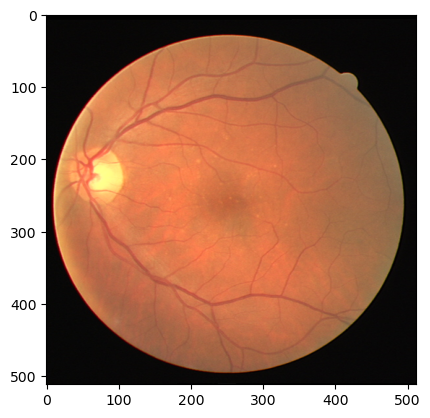

In [6]:
#show the input image
plt.imshow(im)

### code for parts a) - f)

### a) Creating the training dataset

In [6]:
import imageio.v2 as imageio

# Set parameters
n_train_patch = 50
patch_size = 7
n_channels = 2

# Load training data using create_training_set function
Y_train, X_train = create_training_set(train_path, n_train_patch, patch_size, n_channels)

Extracting 50 pataches of size 7x7 from each image.
Extracting data from subject: 0
Extracting data from subject: 1
Extracting data from subject: 2
Extracting data from subject: 3
Extracting data from subject: 4
Extracting data from subject: 5
Extracting data from subject: 6
Extracting data from subject: 7
Extracting data from subject: 8
Extracting data from subject: 9
Extracting data from subject: 10
Extracting data from subject: 11
Extracting data from subject: 12
Extracting data from subject: 13
Extracting data from subject: 14
Extracting data from subject: 15
Extracting data from subject: 16
Extracting data from subject: 17
Extracting data from subject: 18
Extracting data from subject: 19
Extracting data from subject: 20
Extracting data from subject: 21
Extracting data from subject: 22
Extracting data from subject: 23
Extracting data from subject: 24
Extracting data from subject: 25
Extracting data from subject: 26
Extracting data from subject: 27
Extracting data from subject: 28
E

### Setting up the rbf model for cross-validation, testing with different values for C and gamma in order to find the best parameters

In [14]:
# Set up the SVM with RBF kernel
svm_model_rbf = sklearn.svm.SVC(kernel='rbf', probability=True)

# Set up the parameter grid to search over
param_grid_rbf = {'C': np.logspace(-2, 2, 5),
              'gamma': np.logspace(-4, 0, 5)}

# Set up the grid search with cross-validation
grid_search_rbf = model_selection.GridSearchCV(svm_model_rbf, param_grid=param_grid_rbf, cv=5)

# Perform the grid search to find the best hyperparameters
grid_search_rbf.fit(X_train, Y_train)

print(grid_search_rbf.best_params_)

# Train the SVM on the full training set with the best hyperparameters
best_svm_model_rbf = sklearn.svm.SVC(kernel='rbf', probability=True, C=grid_search_rbf.best_params_['C'], gamma=grid_search_rbf.best_params_['gamma'])
best_svm_model_rbf.fit(X_train, Y_train)



{'C': 10.0, 'gamma': 0.0001}


SVC(C=10.0, gamma=0.0001, probability=True)

### Evaluate the performance by making predictions on the training dataset and comparing with the actual masks.

[0.9073882229700289, 0.9104520677475875, 0.9222039519425981, 0.9534362803719256, 0.986486752695349]


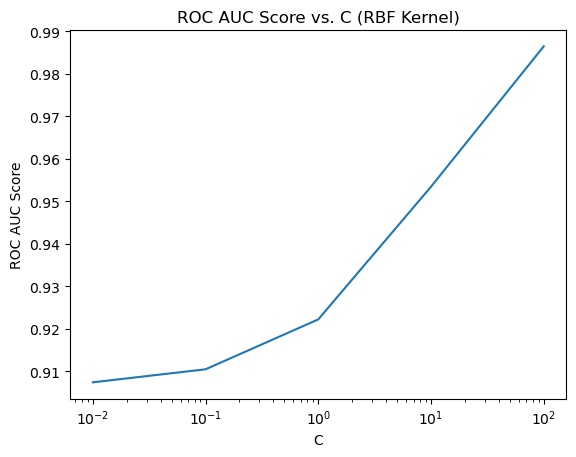

In [123]:
# Evaluate the performance of the SVM with different values of C
roc_auc_scores_rbf = []
c_values = np.logspace(-2, 2, 5)
for c in c_values:
    svm_model_rbf = sklearn.svm.SVC(kernel='rbf', probability=True, C=c, gamma=grid_search_rbf.best_params_['gamma'])
    svm_model_rbf.fit(X_train, Y_train)
    Y_train_pred = svm_model_rbf.predict_proba(X_train)[:, 1]
    roc_auc_scores_rbf.append(roc_auc_score(Y_train, Y_train_pred))

print(roc_auc_scores_rbf)
# Plot the ROC AUC score vs. C
plt.semilogx(c_values, roc_auc_scores_rbf)
plt.title("ROC AUC Score vs. C (RBF Kernel)")
plt.xlabel("C")
plt.ylabel("ROC AUC Score")
plt.show()

### Doing the same thing for the polynomial of degree 3. Searching for the best C value using grid search and cross validation

In [10]:
# Set up the SVM with polynomial kernel of degree 3
svm_model_poly = sklearn.svm.SVC(kernel='poly', degree=3, probability=True)

# Set up the parameter grid to search over
param_grid_poly = {'C': np.logspace(-2, 2, 5)}

# Set up the grid search with cross-validation
grid_search_poly = model_selection.GridSearchCV(svm_model_poly, param_grid=param_grid_poly, cv=5, scoring='roc_auc')

# Perform the grid search to find the best hyperparameters
grid_search_poly.fit(X_train, Y_train)

print(grid_search_poly.best_params_)

# Train the SVM on the full training set with the best hyperparameters
best_svm_model_poly = sklearn.svm.SVC(kernel='poly', degree=3, probability=True, C=grid_search_poly.best_params_['C'])
best_svm_model_poly.fit(X_train, Y_train)


{'C': 0.01}


SVC(C=0.01, kernel='poly', probability=True)

[0.9217323105166082, 0.9231499331097297, 0.9136314447315164, 0.9134024041167158, 0.9194361205146936]


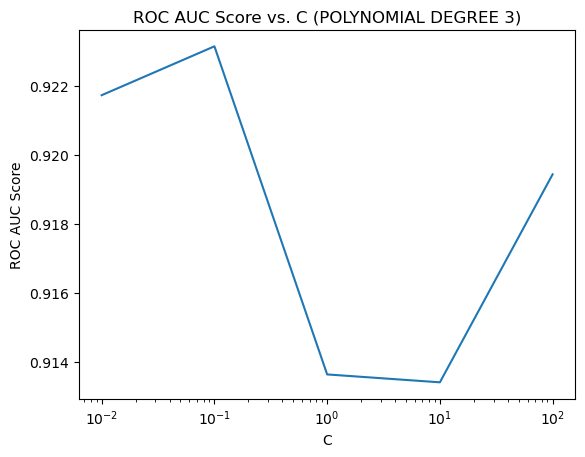

In [11]:
# Evaluate the performance of the SVM with different values of C
roc_auc_scores_poly = []
c_values = np.logspace(-2, 2, 5)
for c in c_values:
    svm_model_poly = sklearn.svm.SVC(kernel='poly', degree=3, probability=True, C=c)
    svm_model_poly.fit(X_train, Y_train)
    Y_train_pred = svm_model_poly.predict_proba(X_train)[:, 1]
    roc_auc_scores_poly.append(roc_auc_score(Y_train, Y_train_pred))

print(roc_auc_scores_poly)
# Plot the ROC AUC score vs. C
plt.semilogx(c_values, roc_auc_scores_poly)
plt.title("ROC AUC Score vs. C (POLYNOMIAL DEGREE 3)")
plt.xlabel("C")
plt.ylabel("ROC AUC Score")
plt.show()

### Plotting the both sets of auc scores, we can observe that the rbf kernel performs better at any point (C value)

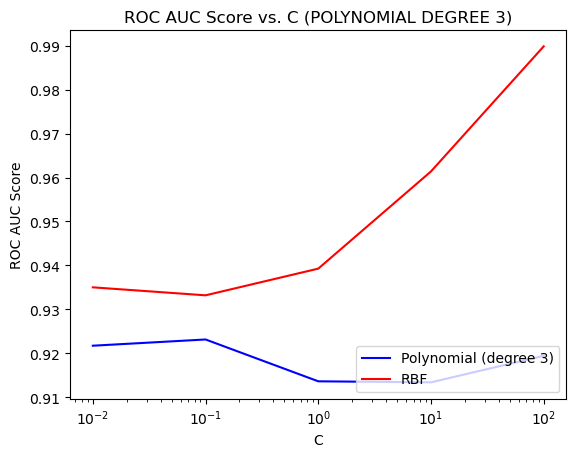

In [12]:
plt.semilogx(c_values, roc_auc_scores_poly, color='blue', label='Polynomial (degree 3)')
plt.semilogx(c_values, roc_auc_scores_rbf, color='red', label='RBF')
plt.title("ROC AUC Score vs. C (POLYNOMIAL DEGREE 3)")
plt.xlabel("C")
plt.ylabel("ROC AUC Score")
plt.legend(loc='lower right')
plt.show()

### b) When using the trained model to validate the images I thought of two possible approaches. 

### First: Segment the validation image into patches of 7x7, make predictions based on the patches, reconstruct the predictions into a [512 / 7] x [512 / 7] predicted mask that we upscale to the original dimensions. Therefore having [512 / 7] * [512 / 7] patches for each image.

### Second: Getting a patch of 7x7 for each pixel, therefore obtaining [512 - 7 + 1] * [512 - 7 + 1] patches. I found this method wrong because we have a training set of 4000 patches, and validating on 256036 is a very bad split of the data we work with, and it also would require a huge amount of time to run the model on.

### Presenting my reasoning, I chose to go with the first implementation.

### Getting the validation images and normalizing the mask to 0-1 range

In [39]:
X_vali = []
Y_vali = []

# Load validation data
for s in np.arange(10):
    tmp = vali_path + 'images/' + str(s) + '.png'
    tmp_msk = vali_path + 'masks/' + str(s) + '.png'
    im = imageio.imread(tmp)
    msk = imageio.imread(tmp_msk)
    X_vali.append(im)
    Y_vali.append(msk)

X_vali = np.array(X_vali)
Y_vali = np.array(Y_vali) // 255

### Method to determine the dice score

In [16]:
def dice_score(y_true, y_pred):
    y_true = y_true.flatten()
    y_pred = y_pred.flatten()

    # Compute the intersection
    intersection = np.sum(y_true * y_pred)

    # Compute the union
    union = np.sum(y_true) + np.sum(y_pred)

    # Compute the dice score
    dice = (2 * intersection) / union
    return round(dice, 3)


### Splitting the validation dataset into patches, getting the prediction, upscaling the resulted mask, determining the score and ploting the results.

Mean Dice Score:  0.4266
Mean AUC Score:  0.754


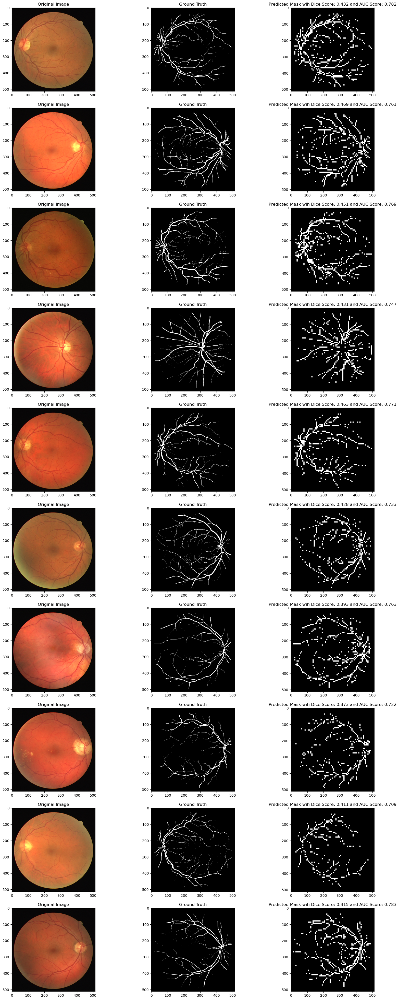

In [41]:
patch_size = 7
chan = 2
dices = []
aucs = []

f, ax = plt.subplots(10, 3, figsize=(20, 50))

for index in range(X_vali.shape[0]):
    img = X_vali[index]
    frames = preprocess_img(img)

    # Crop the frames to be divisible by 7
    frames = frames[:511, :511, :]

    # Create an array of patches
    patches = np.zeros((frames.shape[0] // 7, frames.shape[1] // 7, 7, 7, 2))
    for i in range(patches.shape[0]):
        for j in range(patches.shape[1]):
            # Extract the patch
            patch = frames[i*7:(i+1)*7, j*7:(j+1)*7, :]
            patches[i, j, :, :, :] = patch

    # Reshape the patches array to a 2D array of size (num_patches, 7*7*2)
    patches = patches.reshape(-1, 7*7*2)

    # Predict the labels for the patches
    Y_pred = best_svm_model_rbf.predict(patches)

    # Reshape to 2D
    Y_pred_reshaped = Y_pred.reshape((73, 73))

    # Upscale the predicted mask to the original image size
    Y_pred_tiled = np.repeat(np.repeat(Y_pred_reshaped, 7, axis=0), 7, axis=1)

    # make Y_pred be the same class as Y_vali
    Y_pred_tiled = Y_pred_tiled.astype(Y_vali[index, :511, :511].dtype)

    Y_vali_cut = Y_vali[index, :511, :511]

    dice = dice_score(Y_vali_cut, Y_pred_tiled)
    auc = roc_auc_score(Y_vali_cut.flatten(), Y_pred_tiled.flatten())
    auc = round(auc, 3)
    dices.append(dice)
    aucs.append(auc)

    # Set label for each plot
    ax[index, 0].set_title('Original Image')
    ax[index, 1].set_title('Ground Truth')
    ax[index, 2].set_title('Predicted Mask wih Dice Score: ' + str(dice) + ' and AUC Score: ' + str(auc))

    ax[index, 0].imshow(img, cmap='gray')
    ax[index, 1].imshow(Y_vali[index], cmap='gray')
    ax[index, 2].imshow(Y_pred_tiled, cmap='gray')

print('Mean Dice Score: ', np.mean(dices))
print('Mean AUC Score: ', np.mean(aucs))

### c) Using a Random Forest Classifier. Cross validate with grid search to find the best hyperparameters

In [42]:
# Set up the Random Forest
rf_model = sklearn.ensemble.RandomForestClassifier()

# Set up the parameter grid to search over
param_grid_rf = {'n_estimators': [10, 50, 100, 200, 500], 'max_depth': [2, 5, 10, 20, 50]}

# Set up the grid search with cross-validation
grid_search_rf = model_selection.GridSearchCV(rf_model, param_grid=param_grid_rf, cv=5, scoring='roc_auc')

# Perform the grid search to find the best hyperparameters
grid_search_rf.fit(X_train, Y_train)

print(grid_search_rf.best_params_)

# Create random forest with best hyperparameters
best_rf_model = sklearn.ensemble.RandomForestClassifier(n_estimators=grid_search_rf.best_params_['n_estimators'], max_depth=grid_search_rf.best_params_['max_depth'])

# Train the random forest on the full training set
best_rf_model.fit(X_train, Y_train)

{'max_depth': 10, 'n_estimators': 500}


RandomForestClassifier(max_depth=10, n_estimators=500)

Mean Dice Score:  0.45919999999999994
Mean AUC Score:  0.7906


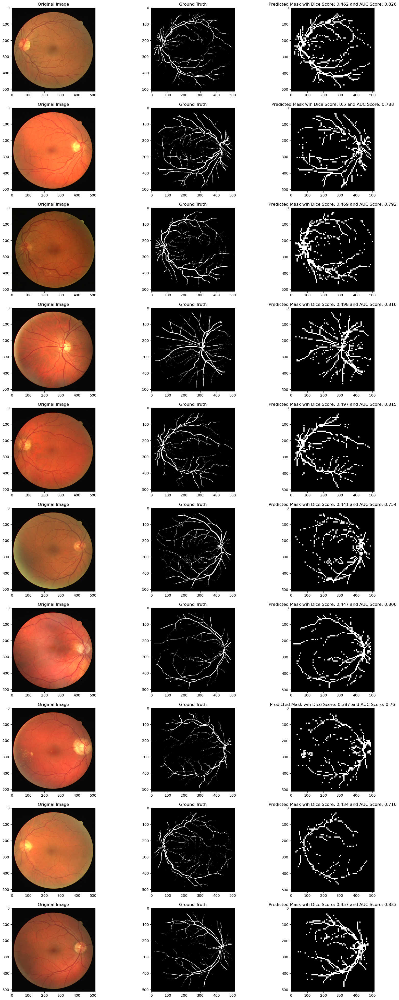

In [43]:
patch_size = 7
chan = 2
dices = []
aucs = []

f, ax = plt.subplots(10, 3, figsize=(20, 50))

for index in range(X_vali.shape[0]):
    img = X_vali[index]
    frames = preprocess_img(img)

    # Crop the frames to be divisible by 7
    frames = frames[:511, :511, :]

    patches = np.zeros((frames.shape[0] // 7, frames.shape[1] // 7, 7, 7, 2))
    for i in range(patches.shape[0]):
        for j in range(patches.shape[1]):
            patch = frames[i*7:(i+1)*7, j*7:(j+1)*7, :]
            patches[i, j, :, :, :] = patch

    # Reshape the patches array to a 2D array of size (num_patches, 7*7*2)
    patches = patches.reshape(-1, 7*7*2)

    # Predict the labels for the patches
    Y_pred = best_rf_model.predict(patches)

    # Reshape to 2D
    Y_pred_reshaped = Y_pred.reshape((73, 73))

    # Upscale the predicted mask to the original image size
    Y_pred_tiled = np.repeat(np.repeat(Y_pred_reshaped, 7, axis=0), 7, axis=1)

    # make Y_pred be the same class as Y_vali
    Y_pred_tiled = Y_pred_tiled.astype(Y_vali[index, :511, :511].dtype)

    Y_vali_cut = Y_vali[index, :511, :511]

    dice = dice_score(Y_vali_cut, Y_pred_tiled)
    auc = roc_auc_score(Y_vali_cut.flatten(), Y_pred_tiled.flatten())
    auc = round(auc, 3)
    dices.append(dice)
    aucs.append(auc)

    # Set label for each plot
    ax[index, 0].set_title('Original Image')
    ax[index, 1].set_title('Ground Truth')
    ax[index, 2].set_title('Predicted Mask wih Dice Score: ' + str(dice) + ' and AUC Score: ' + str(auc))

    ax[index, 0].imshow(img, cmap='gray')
    ax[index, 1].imshow(Y_vali[index], cmap='gray')
    ax[index, 2].imshow(Y_pred_tiled, cmap='gray')

print('Mean Dice Score: ', np.mean(dices))
print('Mean AUC Score: ', np.mean(aucs))

### rbf results: Mean Dice Score:  0.4266 Mean AUC Score:  0.754
### RF results: Mean Dice Score:  0.45919 Mean AUC Score:  0.7906

### The Random Forest classifier performs better, having better scores for both dice and auc scores

### d) The method validate_score_rf performs an anaylis of the performance of the random forest classifier with best hyper parameters, reporting results for different values of number of tpatches and patch size. It returns a dictionary with the results. The update flag is to test for e) with updated parameters in preprocessing

In [77]:
def validate_score_rf(X_vali, Y_vali, train_path, update=False):

    # Setting the parameters for the random forest
    n_train_patches = [50, 100, 500, 1000]
    patch_sizes = [5, 7, 9, 11]

    # Create a dictionary to store the results
    d = {'n_train_patch': [], 'patch_size': [], 'dice': []}

    # Loop over the different parameters
    for n_train_patch in n_train_patches:
        for patch_size in patch_sizes:
            n_channels = preprocess_img(X_vali[0], update=update, nchan=True)

            # Maximum size of the image so that patches can be extracted
            n_max = (512 // patch_size) * patch_size
            dices = []

            # Load training data using create_training_set function
            Y_train, X_train = create_training_set(train_path, n_train_patch, patch_size, n_channels, verbose=False, update=update)

            # Create random forest with best hyperparameters
            best_rf_model = sklearn.ensemble.RandomForestClassifier(n_estimators=grid_search_rf.best_params_['n_estimators'], max_depth=grid_search_rf.best_params_['max_depth'])

            # Train the random forest on the full training set
            best_rf_model.fit(X_train, Y_train)

            # Loop over the validation images
            for index in range(X_vali.shape[0]):
                img = X_vali[index]

                # Preprocess the image
                frames = preprocess_img(img, update=update)

                # Crop the image to the maximum size that can be divided by the patch size
                frames = frames[:n_max, :n_max, :]

                patches = np.zeros((frames.shape[0] // patch_size, frames.shape[1] // patch_size, patch_size, patch_size, n_channels))

                # Loop over the patches
                for i in range(patches.shape[0]):
                    for j in range(patches.shape[1]):
                        # Extract the patch
                        patch = frames[i*patch_size:(i+1)*patch_size, j*patch_size:(j+1)*patch_size, :]
                        patches[i, j, :, :, :] = patch

                # Reshape the patches array to a 2D array of size (num_patches, patch_size*patch_size*n_channels)
                patches = patches.reshape(-1, patch_size*patch_size*n_channels)

                # Predict the labels for the patches
                Y_pred = best_rf_model.predict(patches)

                # Reshape into 2D array
                Y_pred_reshaped = Y_pred.reshape((n_max // patch_size, n_max // patch_size))

                # Tile the array to get the same size as the original image
                Y_pred_tiled = np.repeat(np.repeat(Y_pred_reshaped, patch_size, axis=0), patch_size, axis=1)

                # make Y_pred be the same class as Y_vali
                Y_pred_tiled = Y_pred_tiled.astype(Y_vali[index, :n_max, :n_max].dtype)

                dice = dice_score(Y_vali[index, :n_max, :n_max], Y_pred_tiled)
                dices.append(dice)

            d['dice'].append(np.mean(dices))
            d['n_train_patch'].append(n_train_patch)
            d['patch_size'].append(patch_size)
            print('For n_train_patch: ', n_train_patch, ' and patch_size: ', patch_size, ' Mean Dice Score: ', np.mean(dices))
    
    return d


### Results. As expected, the bigger the training dataset, the better the scores. For each patch size we get better scores if we increase the number of patches. Moreover, the smaller the patch size is, the better the accuracy of the prediction because we label a more detailed section of the image. The smaller the patch is the more correctly we label the pixels from that patch, especially for the patches that have both vessel and non-vessel pixels.

In [49]:
import imageio.v2 as imageio

d = validate_score_rf(X_vali=X_vali, Y_vali=Y_vali, train_path=train_path)

df = pd.DataFrame(d)

print(df)

For n_train_patch:  50  and patch_size:  5  Mean Dice Score:  0.4883
For n_train_patch:  50  and patch_size:  7  Mean Dice Score:  0.4589
For n_train_patch:  50  and patch_size:  9  Mean Dice Score:  0.4069999999999999
For n_train_patch:  50  and patch_size:  11  Mean Dice Score:  0.3641
For n_train_patch:  100  and patch_size:  5  Mean Dice Score:  0.5033
For n_train_patch:  100  and patch_size:  7  Mean Dice Score:  0.45280000000000004
For n_train_patch:  100  and patch_size:  9  Mean Dice Score:  0.40990000000000004
For n_train_patch:  100  and patch_size:  11  Mean Dice Score:  0.36510000000000004
For n_train_patch:  500  and patch_size:  5  Mean Dice Score:  0.5069000000000001
For n_train_patch:  500  and patch_size:  7  Mean Dice Score:  0.4619000000000001
For n_train_patch:  500  and patch_size:  9  Mean Dice Score:  0.4095
For n_train_patch:  500  and patch_size:  11  Mean Dice Score:  0.36589999999999995
For n_train_patch:  1000  and patch_size:  5  Mean Dice Score:  0.51
For 

### e) Results. We can observe that for every combination of parameters, the model with 4 features performs better than the model with 2 features. However the difference is not very significant.

### This feature help the model concentrate more on the red channel because there are the most significant changes. Moreover, applying a median filter should remove any noise.

In [78]:
d_update = validate_score_rf(X_vali=X_vali, Y_vali=Y_vali, train_path=train_path, update=True)

df_update = pd.DataFrame(d_update)

print(df_update)

For n_train_patch:  50  and patch_size:  5  Mean Dice Score:  0.5008999999999999
For n_train_patch:  50  and patch_size:  7  Mean Dice Score:  0.4605
For n_train_patch:  50  and patch_size:  9  Mean Dice Score:  0.40330000000000005
For n_train_patch:  50  and patch_size:  11  Mean Dice Score:  0.3646
For n_train_patch:  100  and patch_size:  5  Mean Dice Score:  0.5058
For n_train_patch:  100  and patch_size:  7  Mean Dice Score:  0.4606
For n_train_patch:  100  and patch_size:  9  Mean Dice Score:  0.4114999999999999
For n_train_patch:  100  and patch_size:  11  Mean Dice Score:  0.36429999999999996
For n_train_patch:  500  and patch_size:  5  Mean Dice Score:  0.5103
For n_train_patch:  500  and patch_size:  7  Mean Dice Score:  0.46390000000000003
For n_train_patch:  500  and patch_size:  9  Mean Dice Score:  0.413
For n_train_patch:  500  and patch_size:  11  Mean Dice Score:  0.3694
For n_train_patch:  1000  and patch_size:  5  Mean Dice Score:  0.51
For n_train_patch:  1000  and 

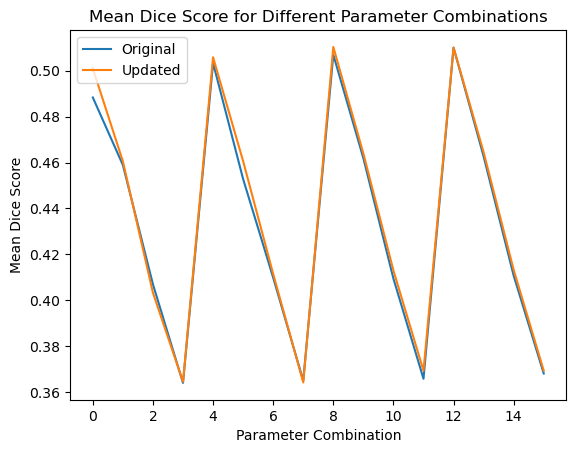

Mean Dice Score for Original:  0.43408125000000003
Mean Dice Score for Updated:  0.43658125000000003


In [86]:
# Plot the results from the dice key of both dictionaries
plt.plot(df['dice'], label='Original')
plt.plot(df_update['dice'], label='Updated')
plt.legend()
plt.xlabel('Parameter Combination')
plt.ylabel('Mean Dice Score')
plt.title('Mean Dice Score for Different Parameter Combinations')
plt.show()

print('Mean Dice Score for Original: ', np.mean(df['dice']))
print('Mean Dice Score for Updated: ', np.mean(df_update['dice']))


### Imported imageio.v2 because of the warnings from vscode

In [60]:
import imageio.v2 as imageio

### f) This method tests the performance of the model on a validation dataset. The model is the model with best performances: the random forest with the best hyperparameters, using the updated 4 channels preprocessing, 5x5 patches and 1000 patches

In [91]:
def validate_best_params_updated(X_vali, Y_vali):
    patch_size = 5
    num_patches = 1000
    n_max = (512 // patch_size) * patch_size
    dices = []
    aucs = []
    n_channels = 4

    f, ax = plt.subplots(10, 3, figsize=(20, 50))

    Y_train_updated, X_train_updated = create_training_set(train_path, num_patches, patch_size, n_channels, verbose=False, update=True)

    best_rf_model = sklearn.ensemble.RandomForestClassifier(n_estimators=500, max_depth=10)
    best_rf_model.fit(X_train_updated, Y_train_updated)

    for index in range(X_vali.shape[0]):
        img = X_vali[index]
        frames = preprocess_img(img, update=True)
        chan = frames.shape[2]

        frames = frames[:n_max, :n_max, :]
        # print(frames.shape)

        patches = np.zeros((frames.shape[0] // patch_size, frames.shape[1] // patch_size, patch_size, patch_size, n_channels))
        for i in range(patches.shape[0]):
            for j in range(patches.shape[1]):
                patch = frames[i*patch_size:(i+1)*patch_size, j*patch_size:(j+1)*patch_size, :]
                patches[i, j, :, :, :] = patch

        # Reshape the patches array to a 2D array of size (num_patches, 7*7*2)
        patches = patches.reshape(-1, patch_size*patch_size*n_channels)

        # Predict the labels for the patches
        Y_pred = best_rf_model.predict(patches)

        Y_pred_reshaped = Y_pred.reshape((n_max // patch_size, n_max // patch_size))

        Y_pred_tiled = np.repeat(np.repeat(Y_pred_reshaped, patch_size, axis=0), patch_size, axis=1)

        # make Y_pred be the same class as Y_vali
        Y_pred_tiled = Y_pred_tiled.astype(Y_vali[index, :n_max, :n_max].dtype)

        Y_vali_cut = Y_vali[index, :n_max, :n_max]

        dice = dice_score(Y_vali_cut, Y_pred_tiled)
        auc = roc_auc_score(Y_vali_cut.flatten(), Y_pred_tiled.flatten())
        auc = round(auc, 3)
        dices.append(dice)
        aucs.append(auc)

        # Set label for each plot
        ax[index, 0].set_title('Original Image')
        ax[index, 1].set_title('Ground Truth')
        ax[index, 2].set_title('Predicted Mask wih Dice Score: ' + str(dice) + ' and AUC Score: ' + str(auc))

        ax[index, 0].imshow(img, cmap='gray')
        ax[index, 1].imshow(Y_vali[index], cmap='gray')
        ax[index, 2].imshow(Y_pred_tiled, cmap='gray')

    print('Mean Dice Score: ', np.mean(dices))
    print('Mean AUC Score: ', np.mean(aucs))

### Showing the results for the validation dataset

Mean Dice Score:  0.5115000000000001
Mean AUC Score:  0.8424999999999999


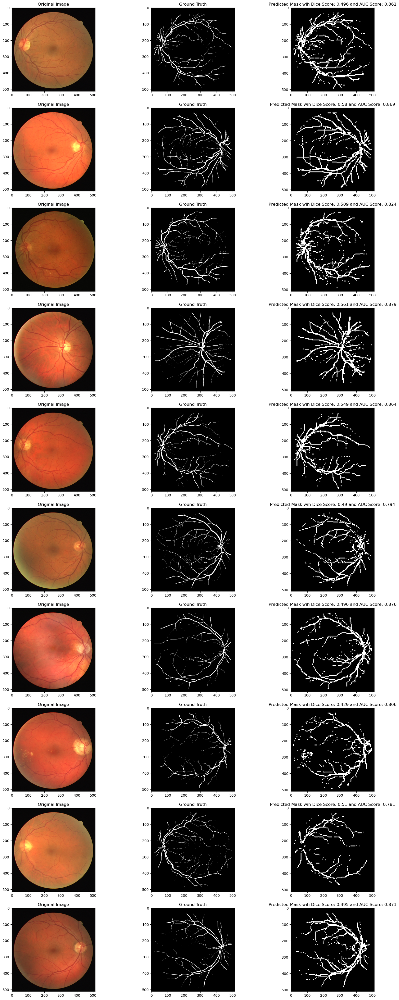

In [92]:
validate_best_params_updated(X_vali=X_vali, Y_vali=Y_vali)

### Getting the test dataset

In [93]:
X_test = []
Y_test = []

for s in np.arange(10):
    tmp = test_path + 'images/' + str(s) + '.png'
    tmp_msk = test_path + 'masks/' + str(s) + '.png'
    im = imageio.imread(tmp)
    msk = imageio.imread(tmp_msk)
    X_test.append(im)
    Y_test.append(msk)

X_test = np.array(X_test)
Y_test = np.array(Y_test) // 255

### Showing the results for the test dataset

Mean Dice Score:  0.5108
Mean AUC Score:  0.8310000000000001


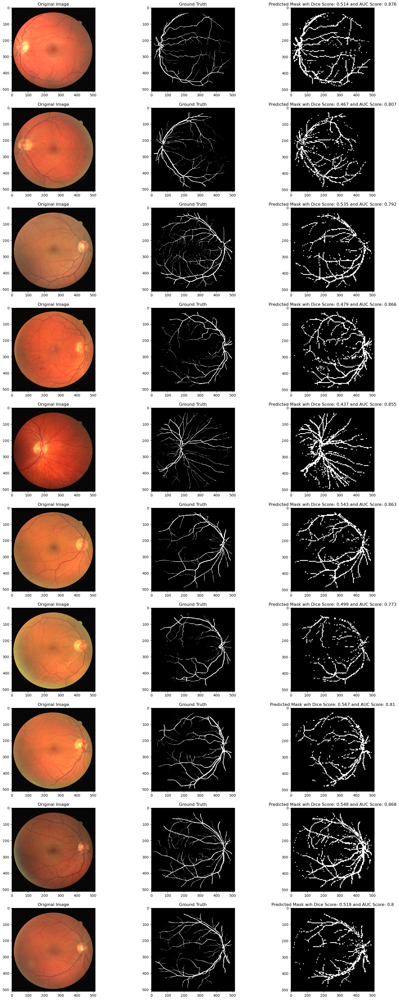

In [94]:
validate_best_params_updated(X_vali=X_test, Y_vali=Y_test)